## Context
This Notebook is created by **Ismail said**, **Ahmed ben Aissa**, and **Amine Chaabini** in the context of The PPP: "the end of year project of the third year of engineering studies ".


As we all know, **Deep Convolutional Generative Adversarial Networks(DCGANs)** is a concept in 
which we apply convolutional neural networks(CNNs) in generative models .The word generative opens the door for us to explore new capabilities of **AI**. Utilizing deep learning, **generative models** could easily learn and capture the patterns, schemas, and regularities in  data .

These capabilities could be utilized to create Art using **AI**. By the way, the approach applied by DCGAN to generate art is similar to the way we, as humans, create **art**. We ask someone to draw a portrait, for example, he would not create it by his imagination from scratch. Instead, he would think for a moment about the portrait he has already seen. Likely, **DCGANs **try to generate new images starting from the real images which will serve as a reference.

In this notebook, we worked on generating new images from a public dataset shared in Kaggle untitled :
**"best-artworks-of-all-time "**


In [2]:
#installing opendatasets to import the dataset direclty from kaggle
!pip install opendatasets --upgrade --quiet

In [3]:
import opendatasets as od

In [4]:
dataset_url = 'https://www.kaggle.com/ikarus777/best-artworks-of-all-time'

In [5]:
od.download(dataset_url,force=True)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

  ismailsaid2001


Your Kaggle Key:

  ································


100%|██████████| 2.29G/2.29G [01:31<00:00, 26.9MB/s]



We import then the dataset into Pytorch .The dataset contains two main Folder the first is untited 'images' and it contains photos of artists labeled by artist .and the second one is untiltled rezize and contain mixed artworks and we will work in this notebook with the second folder because we are not giving importance  in our case to the name of artists (we maybe explore it in an another notebook :))


In [46]:
data_dir = '/kaggle/working/best-artworks-of-all-time/resized/'

In [47]:
import os

In [8]:
# for cls in os.listdir(data_dir):
#   print(cls, ':', len(os.listdir(data_dir + '/' + cls)))

In [48]:
from torchvision.datasets import ImageFolder

In [49]:
dataset = ImageFolder(data_dir)

In [50]:
len(dataset)

8683

In [51]:
import matplotlib.pyplot as plt
%matplotlib inline

## Visualizing some Artworks

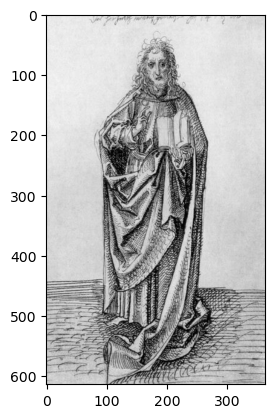

In [52]:
img, label = dataset[20]
plt.imshow(img)

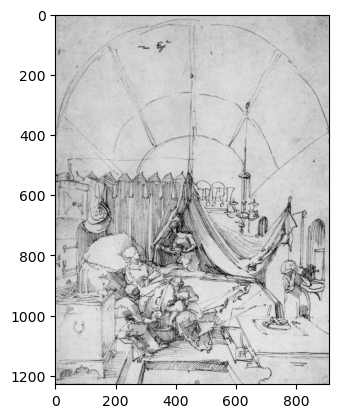

In [53]:
img, label = dataset[400]
plt.imshow(img)

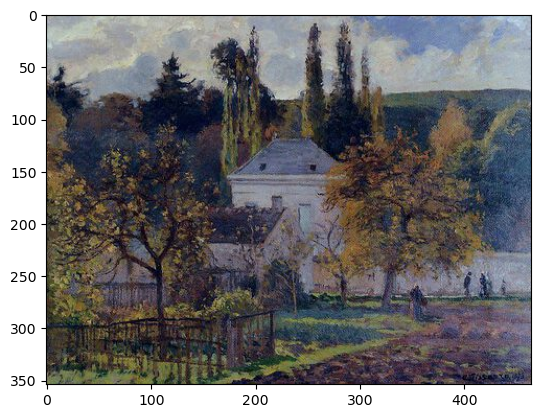

In [54]:
img, label = dataset[1400]
plt.imshow(img)

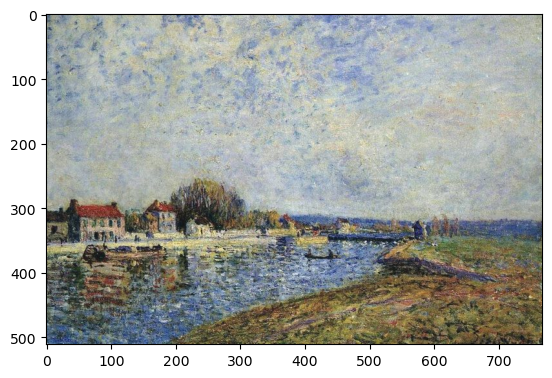

In [55]:
img, label = dataset[715]
plt.imshow(img)

To create batches of pictures, the following steps are followed:

- Resize and center crop all images to ensure they have the same shape and size.

- Convert the images into tensors and normalize them.

- Create a data loader, which facilitates the loading of the prepared image data in batches.

- Examine some samples from the data loader to get an understanding of the processed images.



In [56]:
import torchvision.transforms as tt
from torch.utils.data import DataLoader

In [57]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [58]:
#implementing  the pipeline responsible for all the transformations that we will apply to images 
train_ds = ImageFolder(data_dir, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [59]:
from torchvision.utils import make_grid

In [60]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [61]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

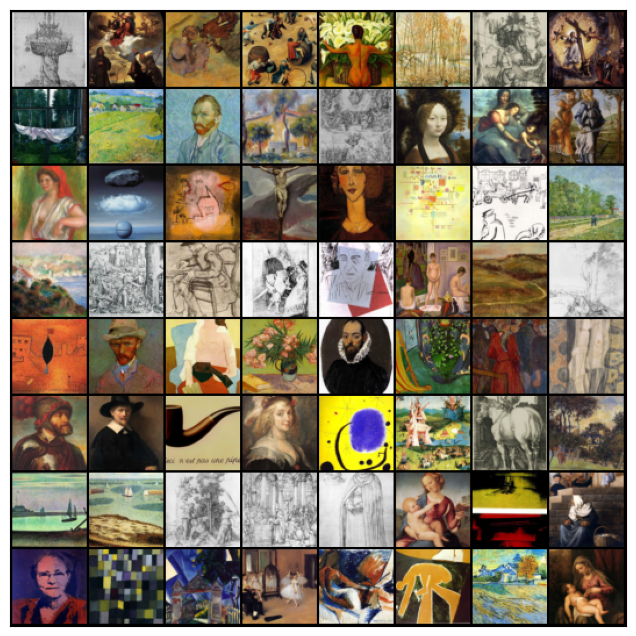

In [63]:
show_batch(train_dl,64)

In [24]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [64]:
import torch

In [65]:
device = get_default_device()
device

device(type='cuda')

In [66]:
train_dl = DeviceDataLoader(train_dl, device)

#Discriminator Network
The discriminator takes  image as an input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

In [67]:
import torch.nn as nn

In [68]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [69]:
# load model
discriminator = to_device(discriminator, device)

The generator network takes in a latent tensor, usually a vector or matrix of **random numbers**, as input. This latent tensor, with a shape of **(128, 1, 1)**, serves as a seed for generating an image. The generator's task is to transform this **latent tensor** into an image tensor with dimensions **3 x 28 x 28**.

To accomplish this, we employ **the ConvTranspose2d** layer from PyTorch. This layer acts as a transposed convolution, also known as a **deconvolution**, allowing the generator to upsample **the latent tensor** and generate the desired image tensor.

In [70]:
latent_size = 128

In [71]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

## Vizualize the very first image generated : it's extremly noisy !

torch.Size([128, 3, 64, 64])


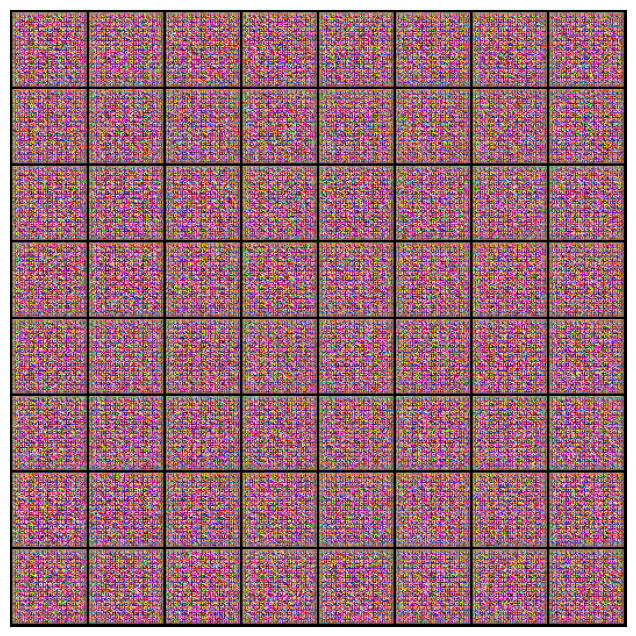

In [72]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

## Maybe it's time to train the model !

In [73]:
generator = to_device(generator, device)

#Discriminator Training
Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

###Here are the steps involved in training the discriminator.

1. We expect the discriminator to output 1 if the image was picked from the real MNIST dataset, and 0 if it was generated using the generator network.

2. We first pass a batch of real images, and compute the loss, setting the target labels to 1.

3. Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0.

4. Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (opt_d only affects the discriminator.parameters())

In [74]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

To train the generator, we utilize a clever technique involving the discriminator as part of the loss function. Here's the process:

- Generate a batch of images using the generator, and then **feed them to the discriminator**.

- Compute the loss by setting the t**arget labels** to **1**, indicating real images. This is done because the generator aims to **deceive** or "fool" **the discriminator**.

- Utilize the loss to perform **gradient descent**, adjusting **the weights** of **the generator**. This allows the generator to improve its ability to generate more **realistic images** that can successfully deceive the discriminator.

In [75]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    #here we could apply label smoothing to make the generator more generalized but we keep it simple 
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [76]:
from torchvision.utils import save_image

In [77]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [78]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [79]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


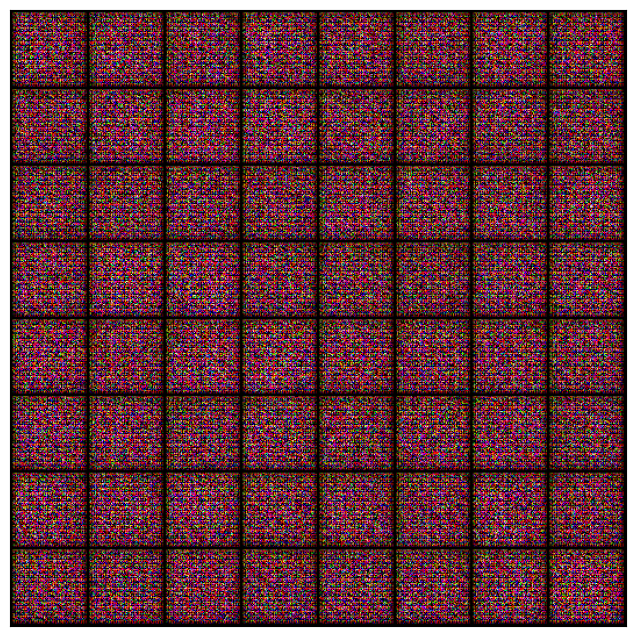

In [80]:
save_samples(0, fixed_latent)


## Full Training Loop
Now we are going to define the fit function which is responsible for the training of both the discrimnator and generator in parallel for each of training data .for the optimization we will apply the Adam optimizer with some customization (using betas) to fit well with the GAN .and after each epoch we save one photo generated using a fixed latent space vector .

<img src="https://www.simplilearn.com/ice9/free_resources_article_thumb/DiscriminatorTraining.PNG" style="max-width:420px; margin-bottom:32px"/>


In [81]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [82]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [44]:
#defining the learning rate and the number of epochs 
lr = 0.0002
epochs = 300

In [103]:
#here we run the model this section is now commented because i have already runned the model over 300 epochs
#and have saved  the final model in a checkpoint 
# history = fit(epochs, lr)

In [95]:
#importing the checkpoint
checkpoint_path='/kaggle/input/checkpoints/G.pth'
checkpoint = torch.load(checkpoint_path, map_location=torch.device('cuda'))

In [99]:
for key in checkpoint.keys():
        print(key)

0.weight
1.weight
1.bias
1.running_mean
1.running_var
1.num_batches_tracked
3.weight
4.weight
4.bias
4.running_mean
4.running_var
4.num_batches_tracked
6.weight
7.weight
7.bias
7.running_mean
7.running_var
7.num_batches_tracked
9.weight
10.weight
10.bias
10.running_mean
10.running_var
10.num_batches_tracked
12.weight


In [98]:
generator.load_state_dict(checkpoint)

<All keys matched successfully>

In [117]:
#importing the function Image to visualize images 
from IPython.display import Image

In [129]:
# Set the generator model to evaluation mode
generator.eval()
#create a latent
latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
# Save generated images
save_samples(305, latent, show=False)

Saving generated-images-0305.png


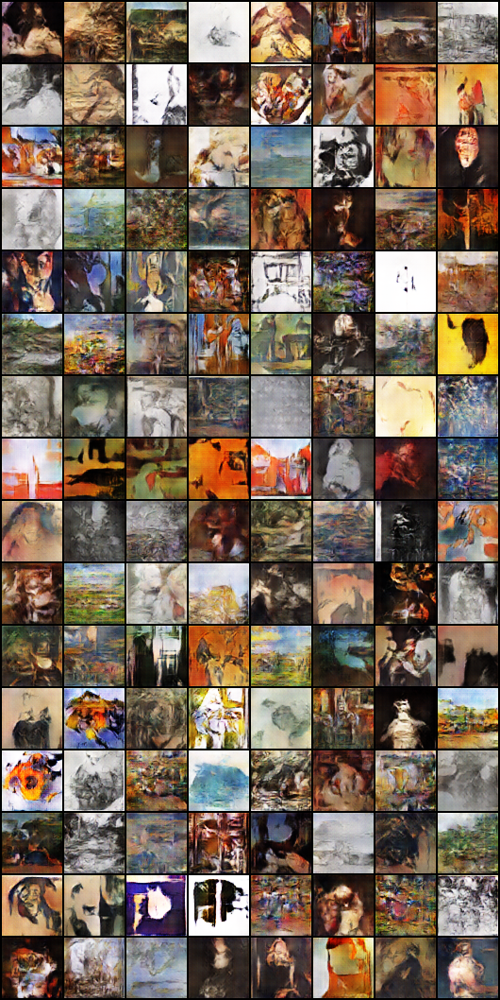

In [130]:
Image('./generated/generated-images-0305.png')

In [131]:
# Set the generator model to evaluation mode
generator.eval()
#create a latent
latent = torch.randn(batch_size, latent_size, 1, 1, device=device
# Save generated images
save_samples(306, latent, show=False)

Saving generated-images-0306.png


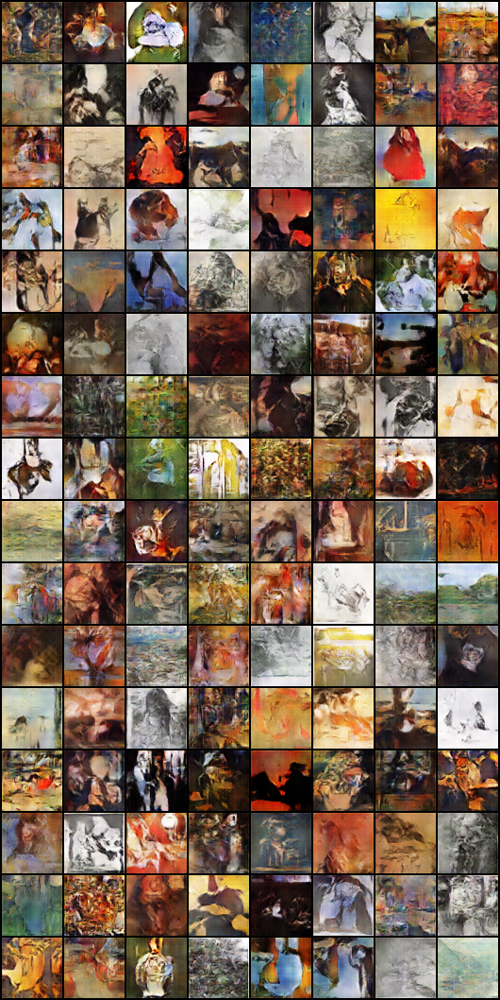

In [132]:
Image('./generated/generated-images-0306.png')

In [133]:
# Set the generator model to evaluation mode
generator.eval()
#create a latent
latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
# Save generated images
save_samples(307, latent, show=False)

Saving generated-images-0307.png


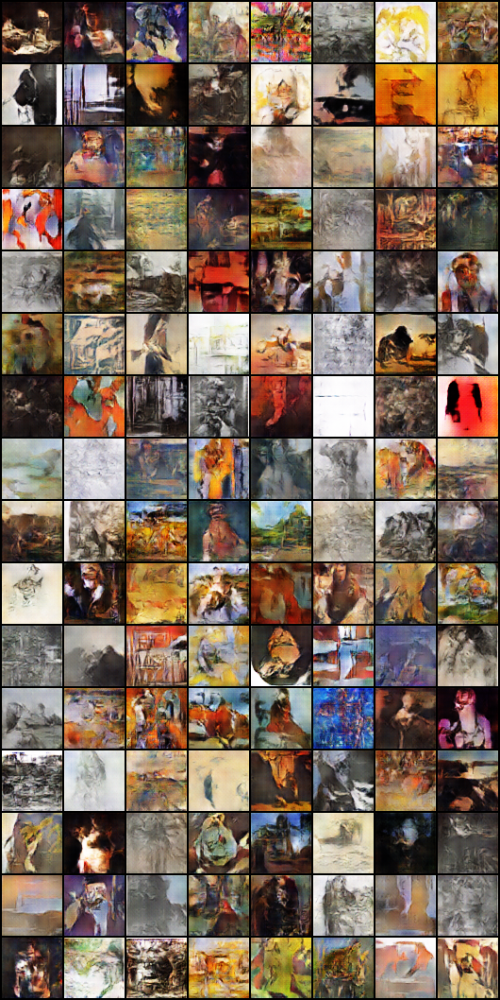

In [134]:
Image('./generated/generated-images-0307.png')

## this part is dedicated just  for the first version when we have run the Model but now we have just explored the checkpoint :

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints (the Generator and the Discriminator)
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
Image('./generated/generated-images-0161.png')

In [ ]:
Image('./generated/generated-images-0236.png')

In [ ]:
Image('./generated/generated-images-0261.png')

In [ ]:
Image('./generated/generated-images-0287.png')

In [ ]:
Image('./generated/generated-images-0300.png')

## Exploring Results 
In this section we will regroup images generated into a video in order to visualize the Improvements 

In [ ]:
import cv2
import os

vid_fname = 'art_gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 5, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

In [ ]:
# Set the generator model to evaluation mode
generator.eval()

# Generate an image by passing the noise through the generator.
generated_image = generator(fixed_latent)
# Save generated images
save_samples(304, fixed_latent, show=False)

In [ ]:
Image('./generated/generated-images-0304.png')

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

#Conclusion
Here we are seeing that the fake pictures quality is good but fake images prediction values are not very good.So now again we can run it using lower learning rate(lr) and near about 80-100 epoches may be able to increase the fake images prediction value.
 